<center><h1> Case Study 3</h1></center>
<center><h3> Week 3 (out of 5)</h3></center>

**Author(s):**
1. Belicia Rodriguez (belicia.rodriguez@emory.edu)
 
**Data Source**: http://fmwww.bc.edu/ec-p/data/wooldridge/datasets.list.html
 
**Book**: [Introductory Econometrics: A Modern Approach](https://economics.ut.ac.ir/documents/3030266/14100645/Jeffrey_M._Wooldridge_Introductory_Econometrics_A_Modern_Approach__2012.pdf) by Jeffrey Wooldridge

<center><h4> PART A</h4></center>

**Background**: So far we have learned to partition (split) the data into a _training_ and a _test_ data set using the `train_test_split` function from the `sklearn.model_selection` submodule in Python. However, this spliting function assumes _random sampling_ aka _cross-sectional_ data, see, i.e., Section 1.3, pages 5-6, of [Introductory Econometrics: A Modern Approach](https://economics.ut.ac.ir/documents/3030266/14100645/Jeffrey_M._Wooldridge_Introductory_Econometrics_A_Modern_Approach__2012.pdf) by Jeffrey Wooldridge. 

1. [20 points] However, you have been given data sets `hprice3` and `rental` from the data source above. After identifying the correct data structure (read Section 1.3, pages 5-11, of [Introductory Econometrics: A Modern Approach](https://economics.ut.ac.ir/documents/3030266/14100645/Jeffrey_M._Wooldridge_Introductory_Econometrics_A_Modern_Approach__2012.pdf) by Jeffrey Wooldridge), proceed to construct a _training_ (75%) as well as a _test_ (25%) data set for each of them that preserves the original data structure in each of the newly created splits. Please set the seed to be equal to 42 for replicability purposes. Furthermore, for the purpose of this question you can select _any_ variable as your outcome variable and subset of variables as your set of features. **Hint**: In one case you can use the `GroupShuffleSplit` function from `sklearn`, in the other you can apply the `train_test_split` functions to a correctly pre-partitioned data set, and then just join the split accordingly.

In [1]:
import pandas as pd
import numpy as np
import patsy
from sklearn.model_selection import train_test_split, GroupShuffleSplit, GridSearchCV, cross_val_score
from sklearn.svm import SVC
from sklearn import preprocessing
from matplotlib.colors import ListedColormap
import matplotlib.pyplot as plt
import warnings

# import dataset as pandas dataframe
hprice3 = pd.read_stata('http://fmwww.bc.edu/ec-p/data/wooldridge/hprice3.dta')
rental = pd.read_stata('http://fmwww.bc.edu/ec-p/data/wooldridge/rental.dta')

# specifications for the models
h_spec = 'lprice ~ -1 + age + agesq + linst + rooms + area + baths + y81'
r_spec = 'tothsg ~ -1 + pop + enroll + rent + rnthsg + y90' 

# create design matrices for specifications
yh, Xh = patsy.dmatrices(h_spec, data=hprice3, return_type='dataframe')
yr, Xr = patsy.dmatrices(r_spec, data=rental, return_type='dataframe')

# hprice3: for cross-sectional data use train_test_split to split data
Xh_train, Xh_test, yh_train, yh_test = train_test_split(Xh, yh, test_size=0.25, random_state=42)

# rental: for panel data use GroupShuffleSplit to split data at year ('80 and '90)
gss = GroupShuffleSplit(n_splits=1, test_size=0.25, random_state=42)
for train_id, test_id in gss.split(Xr, yr, groups = rental.year):
    # training set
    Xr_train = Xr.iloc[train_id]
    yr_train = yr.iloc[train_id]

    # testing set
    Xr_test = Xr.iloc[test_id]
    yr_test = yr.iloc[test_id]

**Comments:** 

(1) for the ```hprice3``` data you have two cross-sections in two different years, i.e., 1978 and 1981. Thus, the data inside each year can be consider a random sample and the spiting can be done using the traditional approach. Note that you have to first partition the data based on the years.

(2) You should use the city indicator as the grouping variable. When you use ```year``` as the grouping, you obtain observations from year 80 only in the train set, and observations from year 90 only in the test set. This does not preserves the original structure of the data.


<center><h4> PART B</h4></center>

**Background**: This part uses the same [data set](https://app.quadstat.net/system/files/datasets/dataset-63314.csv) as in the `SVM_py.ipynb` notebook

2. [20 points] Modify this code in the lecture notes:

```python
svcPoly = SVC(kernel='poly',degree=3)

Cs = np.logspace(-6, -1, 10)
clf = GridSearchCV(estimator=svcPoly, param_grid=dict(C=Cs),n_jobs=-1)
clf.fit(X_train_scaled, y_train.values.ravel())

print(clf.best_score_ )
print(clf.best_estimator_.C  )

# Prediction performance on test set is not better that on train set
clf.score(X_test_scaled, y_test)
```

so it allows for a grid search over the degree of the polynomial, i.e., 1, 2, 3, 4, 5, and 6 as well.

In [2]:
# import dataset using provided link
df = pd.read_csv('https://app.quadstat.net/system/files/datasets/dataset-63314.csv')

# map the 'no' and 'yes' strings into numerical values for numerical calculations
df['default'] = df['default'].map({'Yes': 1, 'No': 0})
df['student'] = df['student'].map({'Yes': 1, 'No': 0})

# create design matrices
y, X = patsy.dmatrices('default ~ -1 + balance + income', data=df, return_type='dataframe')

# create train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

# scale training and test X sets
X_train_scaled = preprocessing.scale(X_train)
X_test_scaled = preprocessing.scale(X_test)

# MODIFY FOLLOWING CODE:
svcPoly = SVC(kernel='poly',degree=6)

Cs = np.logspace(-6, -1, 10)
clf = GridSearchCV(estimator=svcPoly, param_grid=dict(C=Cs),n_jobs=-1)
clf.fit(X_train_scaled, y_train.values.ravel())

print('Classification Best Score:', round(clf.best_score_,6))
print('Classification Best Estimator:', round(clf.best_estimator_.C,6))

# Prediction performance on test set is slightly worse than training set with modification
print('Classification Test Set Prediction Performance:', clf.score(X_test_scaled, y_test))

Classification Best Score: 0.972267
Classification Best Estimator: 0.027826
Classification Test Set Prediction Performance: 0.9712


**Comments:** 

In your modified code you are defining the degree parameter to be exactly 6. The objective of the question is to search over different values of the parameter. You needed to create an array with the values from 1 to 6 and add that to the grid search.

3. [20 points] Modify this code in the lecture notes:

```python
svcRadial = SVC(kernel='rbf',gamma=.01)

Cs = np.logspace(-6, -1, 10)
clf = GridSearchCV(estimator=svcRadial, param_grid=dict(C=Cs),n_jobs=-1)
clf.fit(X_train_scaled, y_train.values.ravel())

print(clf.best_score_ )
print(clf.best_estimator_.C  )

# Prediction performance on test set is not better that on train set
clf.score(X_test_scaled, y_test)
```
so it allows for a grid search over the gamma parameter. **Hint**: Read [RBF SVM Parameters](https://scikit-learn.org/stable/auto_examples/svm/plot_rbf_parameters.html) to understand the importance of the gamma parameter.

In [3]:
# MODIFY THIS CODE:
svcRadial = SVC(kernel='rbf')

Cs = np.logspace(-6, -1, 10)
gamma_value = np.logspace(-9, 3, 13)
clf = GridSearchCV(estimator=svcRadial, param_grid=dict(C=Cs, gamma = gamma_value),n_jobs=-1)
clf.fit(X_train_scaled, y_train.values.ravel())

print('Classification Best Score:', clf.best_score_)
print('Classification Best Estimator', clf.best_estimator_.C)

# Prediction performance on test set has improved with modification
print('Classification Test Set Prediction Performance:', clf.score(X_test_scaled, y_test))

# Store best estimator for following question
clf_best_C = clf.best_estimator_.C
clf_best_gamma = clf.best_estimator_.gamma

Classification Best Score: 0.9672
Classification Best Estimator 0.1
Classification Test Set Prediction Performance: 0.9688


4. Read this [post](https://chrisalbon.com/machine_learning/support_vector_machines/svc_parameters_using_rbf_kernel/) and modify the code in it to create 2 _multi-figures_ plots using the `rbf` kernel above as follows:
    1. [20 points] Create a 2 x 2 [multi-figure plot](https://matplotlib.org/devdocs/gallery/subplots_axes_and_figures/subplots_demo.html) keeping `C` constant and equal to the value stored in `clf.best_estimator_.C` in question 3 above, but letting `gamma` equal to 0.01 (plot position [1,1]), to 1.0 (plot position [1,2]), to 10.0 (plot position [2,1]), and equal to 100.0 (plot position [2,2]).
    2. [20 points] reate a 2 x 2 [multi-figure plot](https://matplotlib.org/devdocs/gallery/subplots_axes_and_figures/subplots_demo.html) keeping `gamma` constant and equal to the value stored in `clf.best_estimator_.gamma` in question 3 above (after you modify it of course), but letting `C` equal to 1 (plot position [1,1]), to 10 (plot position [1,2]), to 1000 (plot position [2,1]), and equal to 10000.0 (plot position [2,2]).

In [4]:
# function from post that creates visualizations of classification regions
def plot_decision_region_modified(X, y, ax, classifier, grid_coord_1 = None, grid_coord_2 = None, resolution = 0.02, test_idx=None):

    # setup marker generator and color map
    markers = ('s', 'x', 'o', '^', 'v')
    colors = ('red', 'blue', 'lightgreen', 'gray', 'cyan')
    cmap = ListedColormap(colors[:len(np.unique(y))])

    # plot the decision surface
    x1_min, x1_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    x2_min, x2_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx1, xx2 = np.meshgrid(np.arange(x1_min, x1_max, resolution), np.arange(x2_min, x2_max, resolution))
    Z = classifier.predict(np.array([xx1.ravel(), xx2.ravel()]).T)
    Z = Z.reshape(xx1.shape)

    ax[grid_coord_1, grid_coord_2].contourf(xx1, xx2, Z, alpha=0.4, cmap=cmap)
    ax[grid_coord_1, grid_coord_2].set_xlim(xx1.min(), xx1.max())
    ax[grid_coord_1, grid_coord_2].set_ylim(xx2.min(), xx2.max())

    for idx, cl in enumerate(np.unique(y)):
        ax[grid_coord_1, grid_coord_2].scatter(x=X[y == cl, 0], y=X[y == cl, 1], alpha=0.8,                                                     cmap=cmap(idx), marker=markers[idx], label=cl)

    # highlight test samples
    if test_idx:
        # plot all samples
        if not versiontuple(np.__version__) >= versiontuple('1.9.0'):
            X_test, y_test = X[list(test_idx), :], y[list(test_idx)]
            warnings.warn('Please update to NumPy 1.9.0 or newer')
        else:
            X_test, y_test = X[test_idx, :], y[test_idx]

        # plot points 
        ax[grid_coord_1, grid_coord_2].scatter(X_test[:, 0],
            X_test[:, 1],
            alpha=1.0,
            linewidths=1,
            marker='o',
            s=55, label='test set')

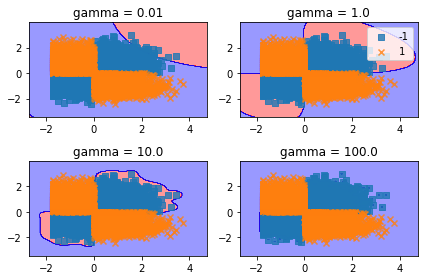

In [5]:
%matplotlib inline
# define the y values
y_logical = np.logical_xor(X_train_scaled[:, 0] > 0, X_train_scaled[:, 1] > 0)
y_logical = np.where(y_logical, 1, -1)

# create figure and axes
fig, axs = plt.subplots(2, 2)

# gamma = 0.01
gamma_value = 0.01
svcRadial = SVC(kernel='rbf', gamma = gamma_value, C = clf_best_C)
svcRadial.fit(X_train_scaled, y_logical)
plot_decision_region_modified(X_train_scaled, y_logical, axs, classifier = svcRadial, grid_coord_1 = 0, grid_coord_2 = 0)
axs[0, 0].set_title('gamma = {}'.format(gamma_value))

# gamma = 1.0
gamma_value = 1.0
svcRadial = SVC(kernel='rbf', gamma = gamma_value,  C = clf_best_C)
svcRadial.fit(X_train_scaled, y_logical)
plot_decision_region_modified(X_train_scaled, y_logical, axs, classifier = svcRadial, grid_coord_1 = 0, grid_coord_2 = 1)
axs[0, 1].set_title('gamma = {}'.format(gamma_value))

# gamma = 10.0
gamma_value = 10.0
svcRadial = SVC(kernel='rbf', gamma = gamma_value,  C = clf_best_C)
svcRadial.fit(X_train_scaled, y_logical)
plot_decision_region_modified(X_train_scaled, y_logical, axs, classifier = svcRadial, grid_coord_1 = 1, grid_coord_2 = 0)
axs[1, 0].set_title('gamma = {}'.format(gamma_value))

# gamma = 100.0
gamma_value = 100.0
svcRadial = SVC(kernel='rbf', gamma = gamma_value,  C = clf_best_C)
svcRadial.fit(X_train_scaled, y_logical)
plot_decision_region_modified(X_train_scaled, y_logical, axs, classifier = svcRadial, grid_coord_1 = 1, grid_coord_2 = 1)
axs[1, 1].set_title('gamma = {}'.format(gamma_value))

# fix layout
fig.tight_layout()
axs[0,1].legend(loc='best')
plt.show()

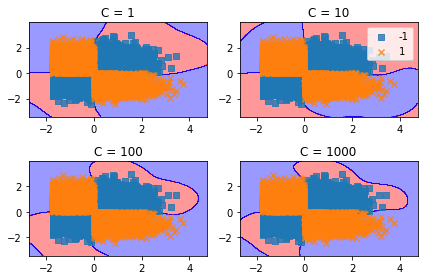

In [6]:
# create figure and axes
fig, axs = plt.subplots(2, 2)

# C = 1
svcRadial = SVC(kernel='rbf', gamma = clf_best_gamma, C = 1)
svcRadial.fit(X_train_scaled, y_logical)
plot_decision_region_modified(X_train_scaled, y_logical, axs, classifier = svcRadial, grid_coord_1 = 0, grid_coord_2 = 0)
axs[0, 0].set_title('C = {}'.format(1))

# C = 10
svcRadial = SVC(kernel='rbf', gamma = clf_best_gamma,  C = 10)
svcRadial.fit(X_train_scaled, y_logical)
plot_decision_region_modified(X_train_scaled, y_logical, axs, classifier = svcRadial, grid_coord_1 = 0, grid_coord_2 = 1)
axs[0, 1].set_title('C = {}'.format(10))

# C = 100
svcRadial = SVC(kernel='rbf', gamma = clf_best_gamma,  C = 100)
svcRadial.fit(X_train_scaled, y_logical)
plot_decision_region_modified(X_train_scaled, y_logical, axs, classifier = svcRadial, grid_coord_1 = 1, grid_coord_2 = 0)
axs[1, 0].set_title('C = {}'.format(100))

# C = 1000
svcRadial = SVC(kernel='rbf', gamma = clf_best_gamma,  C = 1000)
svcRadial.fit(X_train_scaled, y_logical)
plot_decision_region_modified(X_train_scaled, y_logical, axs, classifier = svcRadial, grid_coord_1 = 1, grid_coord_2 = 1)
axs[1, 1].set_title('C = {}'.format(1000))

# fix layout
fig.tight_layout()
axs[0,1].legend(loc='best')

**Comment:**

It seems like the plots are graphing a different cloud of data points